# Character Segmentation
****

## Importing Dependencies

In [127]:
import cv2 
import os
import numpy as np
import pandas as pd
import matplotlib.pylab as plt

from skimage.filters import sobel
from skimage.segmentation import watershed

plt.rcParams['axes.edgecolor'] = 'black'  # Color of the borders
plt.rcParams['axes.linewidth'] = 1.5
plt.rcParams['font.size'] = 20

## Functions

### Preprocessing Functions

In [ ]:
def preprocessing(document_image, blur_kernel=5, dilate_height, dilate_width):
    sharpen_kernel = np.array([[-1, -1, -1],
                               [-1, 10, -1],
                               [-1, -1, -1]])
    sharpen = cv2.filter2D(document_image, -1, sharpen_kernel)
    gray = cv2.cvtColor(sharpen, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (blur_kernel, blur_kernel), 100)
    
    _, threshold = cv2.threshold(blur, 100, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    elevation_map = sobel(threshold)
    markers = np.zeros_like(threshold)
    markers[threshold < 30] = 1
    markers[threshold > 150] = 2
    segmentation_ = watershed(elevation_map, markers)
    segmentation_noramlized = cv2.normalize(src = segmentation_, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)


    dilate_kernel=np.ones((dilate_height, dilate_width),np.uint8)
    dilated_image=cv2.dilate(segmentation_normalized, dilate_kernel, iterations=1)

    return dilated_image

In [ ]:
def contours(dilated_image, epsilon=5, X=0, Y=0, bound_threshold=0.5):
    contours, hierarchy  = cv2.findContours(dilated_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours_poly = [None] * len(contours)
    
    bounds = []
    for i, c in enumerate(contours):
        if hierarchy [0][i][3] == -1:
            contours_poly[i] = cv2.approxPolyDP(c, epsilon, True)
            bounds.append(cv2.boundingRect(contours_poly[i]))
    if X:
        bounds = sorted(bounds, key=lambda a: a[0], reverse=False)
    if Y:
        bounds = sorted(bounds, key=lambda a: a[1], reverse=False)

    merged_bounds = []

    for bound in bounds:
        x, y, w, h = bound
        updated_bound = (x, y, x + w, y + h)

        overlapping = False
        for i, merged_bound in enumerate(merged_bounds):
            mx1, my1, mx2, my2 = merged_bound
            if (x >= mx1 and x <= mx2) or (mx1 >= x and mx1 <= x + w):
                bound_area = w * h
                merged_bound_area = (mx2 - mx1) * (my2 - my1)
                if bound_area / merged_bound_area < bound_threshold:
                    merged_bounds[i] = (min(x, mx1), min(y, my1), max(x + w, mx2), max(y + h, my2))
                    overlapping = True
                    break

        if not overlapping:
            merged_bounds.append(updated_bound)

    merged_bounds = [(x1, y1, x2 - x1, y2 - y1) for (x1, y1, x2, y2) in merged_bounds]
    return merged_bounds

In [ ]:
def segmented_list(document_image, merged_bounds)
    segmented_list = []
    for i in range(len(merged_bounds)):
        x, y, w, h = merged_bounds[i]
        
        if w > 0 and h > 0:
            dimension_offset = 5
            position_offset = 2

            h = h + dimension_offset
            w = w + dimension_offset
            x = x - position_offset
            y = y - position_offset
                
            cropped_image = document_image[y:y+h, x:x+w]
            segmented_list.append(cropped_image)
        
    return segmented_list

In [14]:
def merge_boxes(bounding_boxes, ):
    

    return merged_boxes

### General Functions

In [163]:
def plot_bounds(image, bound_list, ht=10, line_width=2):
    image_copy = image.copy()
    plt.figure(figsize=(40, ht))
    for i in range(len(bound_list)):
        color = (255, 0, 0)
        cv2.rectangle(image_copy, 
                     (int(bound_list[i][0]), int(bound_list[i][1])),
                     (int(bound_list[i][0] + bound_list[i][2]), 
                      int(bound_list[i][1] +bound_list[i][3])),
                      color, line_width)
    plt.imshow(image_copy, 'gray')
    # plt.title('dilateED BOUNDINGS')
    plt.axis('off')
    plt.show()

In [159]:
def plot_segments(segmented_list, ht=10):
    num_images = len(segmented_list)
    num_rows = int(np.ceil(num_images / 3))

    
    plt.figure(figsize=(40, ht))
    for i in range(num_images):
        plt.subplot(num_rows, 3, i+1)
        plt.imshow(segmented_list[i])
        plt.title(f'SEGMENT {i+1}')
        plt.axis('off')
    plt.show()

In [13]:
def drop_zero_size_images(image_list):
    filtered_images = []
    for image in image_list:
        if 0 not in image.shape:
            filtered_images.append(image)

    print(f'Dropped Images: {len(image_list) - len(filtered_images)}')
    return filtered_images

## Document --> Lines

(834, 602, 3) (1754, 1240, 3)


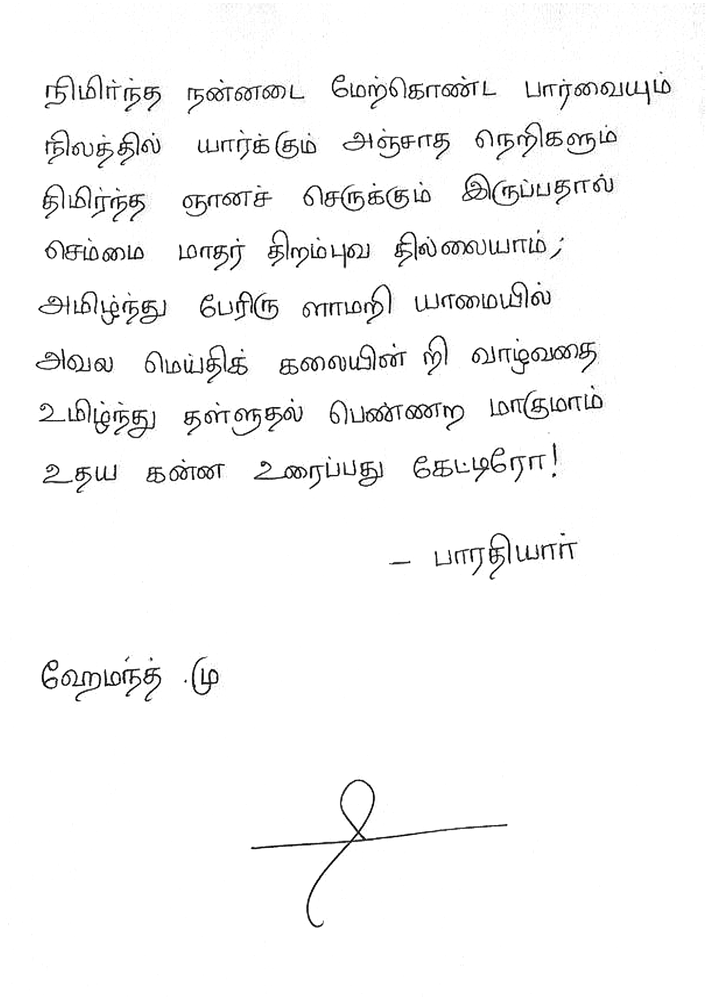

In [184]:
doc = cv2.imread('dataset/Handwrttingp2.jpg')
doc_resized = cv2.resize(doc, (1240, 1754))
sharpen_kernel = np.array([[-1, -1, -1],
                            [-1, 10, -1],
                            [-1, -1, -1]])
sharpen = cv2.filter2D(doc_resized, -1, sharpen_kernel)
gray = cv2.cvtColor(sharpen, cv2.COLOR_BGR2GRAY)
print(doc.shape, doc_resized.shape)
plt.figure(figsize=(40,40))
plt.axis('off')
plt.imshow(gray, 'gray')
plt.show()

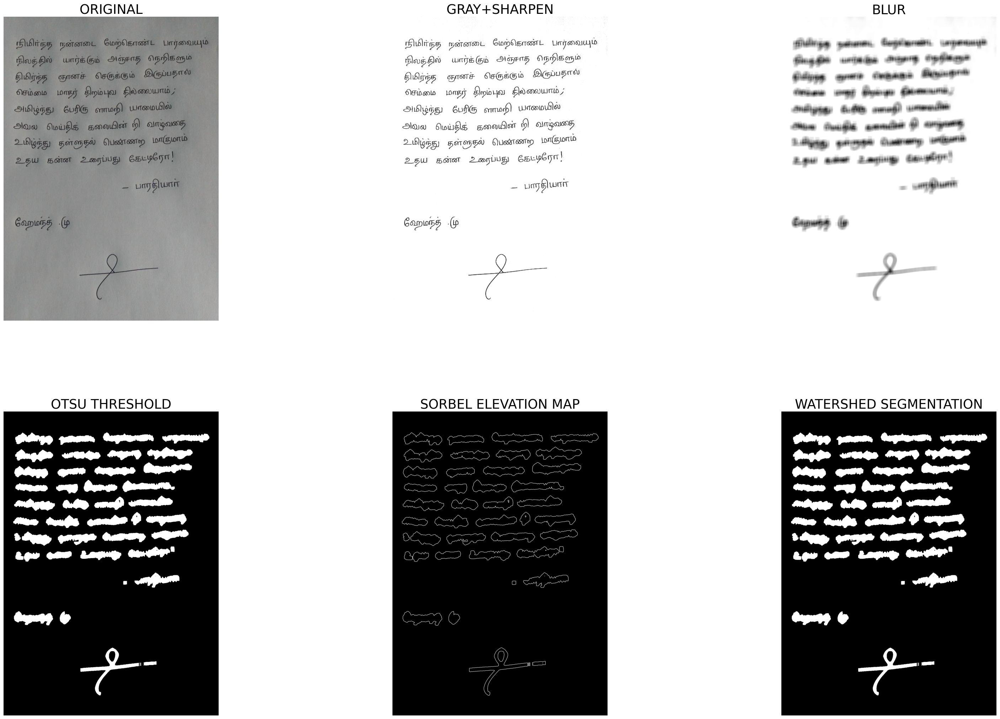

Returned segmented image.


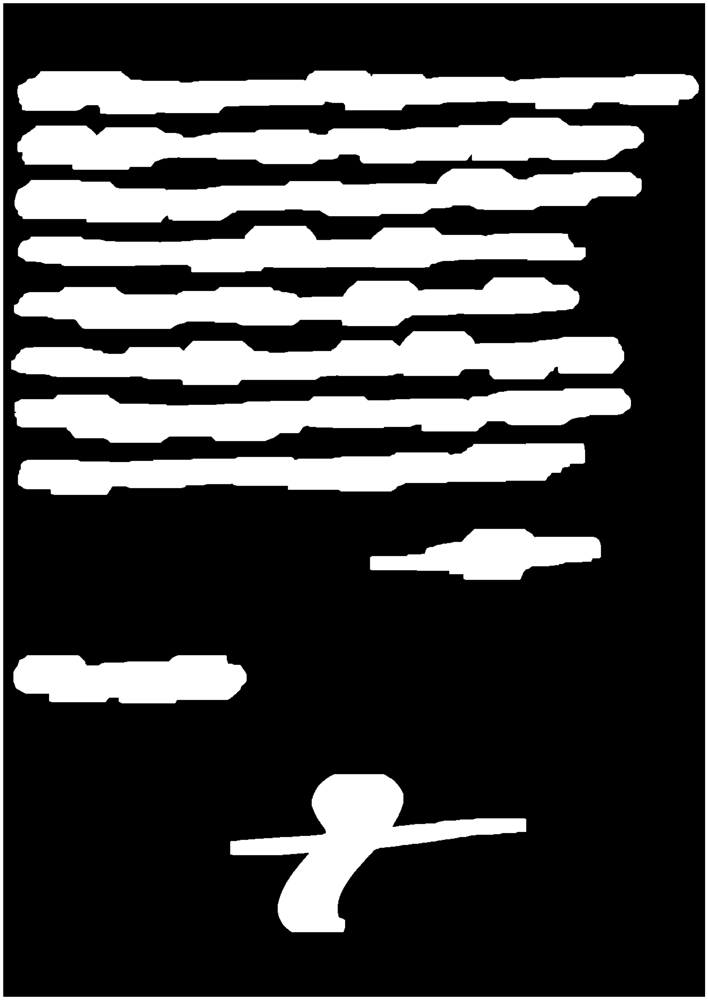

Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


In [185]:
preprocessed_doc = preprocessing(doc_resized, kernel=23, plot=1, otsu=1, ht=40)

# sharpen = cv2.filter2D(doc_resized, -1, sharpen_kernel)
# doc_resized = cv2.cvtColor(sharpen, cv2.COLOR_BGR2GRAY)
# doc_resized = cv2.cvtColor(doc_resized, cv2.COLOR_GRAY2BGR)

line_th = dilate(preprocessed_doc, height=5, width=85, plot=1, ht=40)
line_bounds= bounds(line_th, y=1, plot=0)
line_segmented_list = segmented_list(doc_resized, line_bounds)

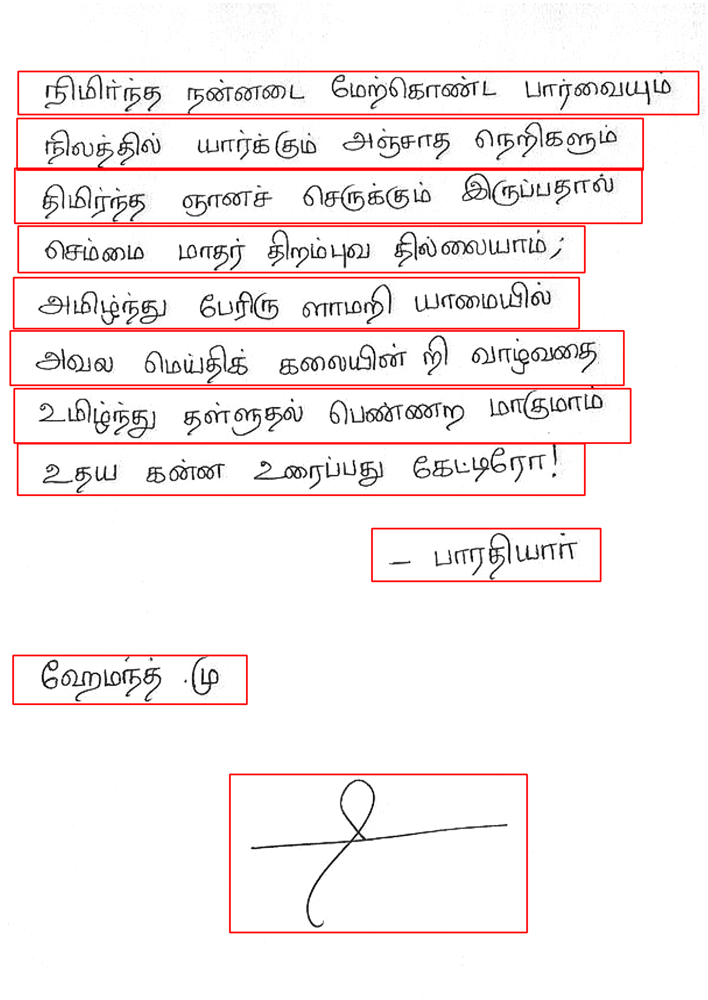

In [183]:
plot_bounds(doc_resized, line_bounds, ht=40)

In [186]:
line_segmented_list = drop_zero_size_images(line_segmented_list)

Dropped Images: 0


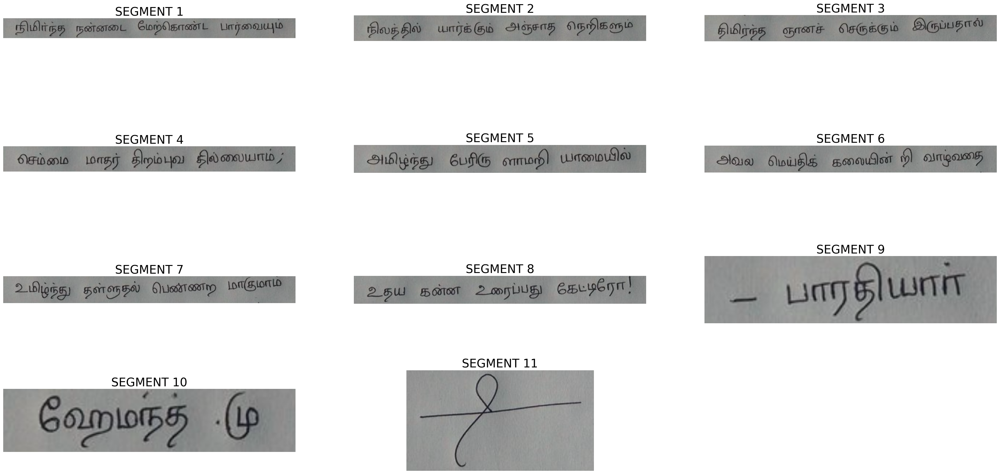

In [187]:
plt.rcParams['font.size'] = 22
plot_segments(line_segmented_list, ht=20)

In [20]:
len(line_segmented_list)

11

## Line --> Words

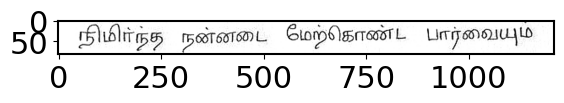

In [168]:
image = line_segmented_list[0]
plt.imshow(image)

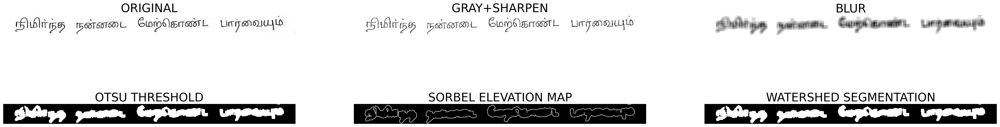

Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


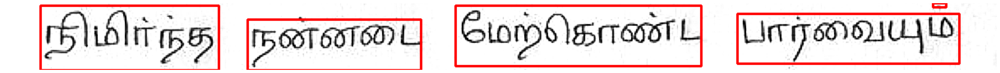

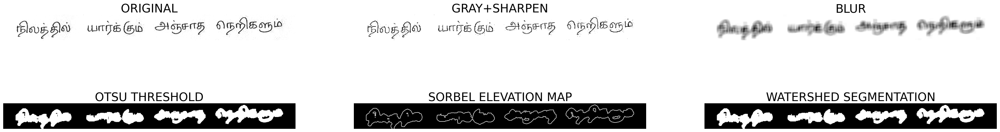

Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


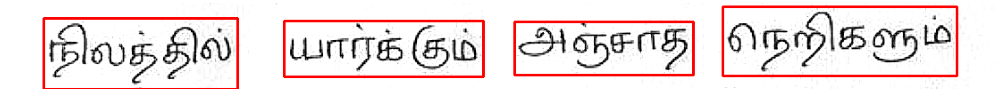

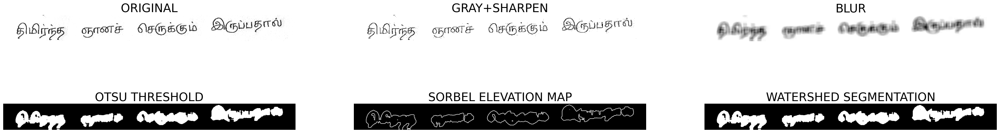

Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


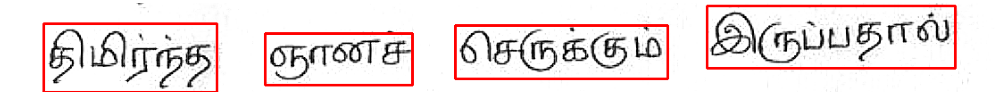

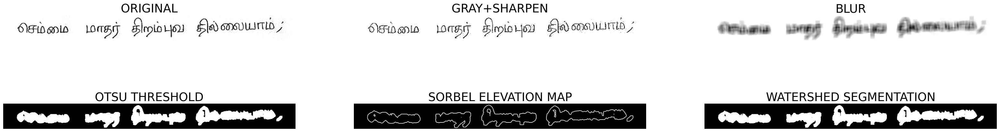

Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


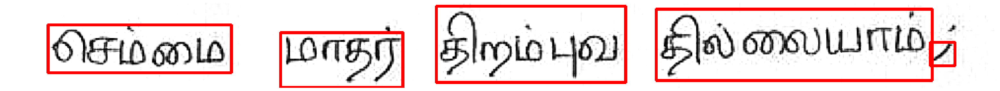

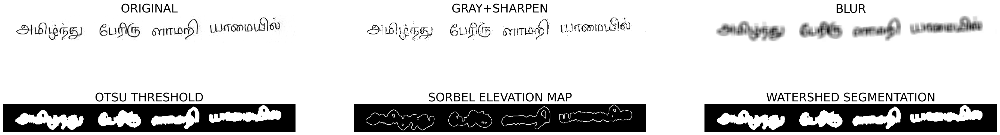

Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


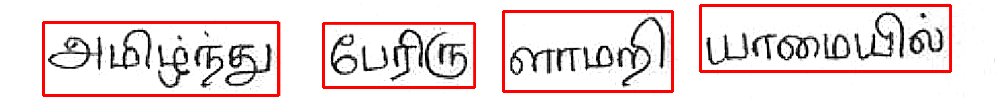

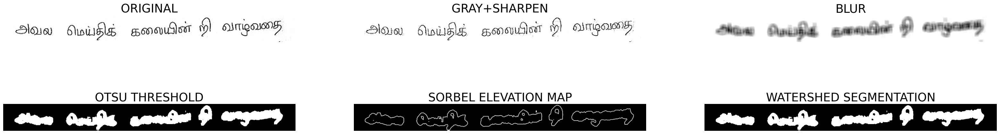

Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


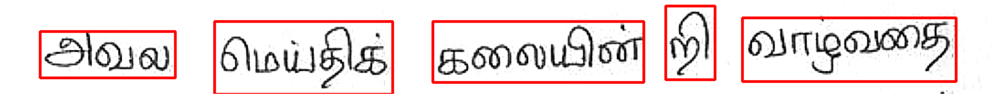

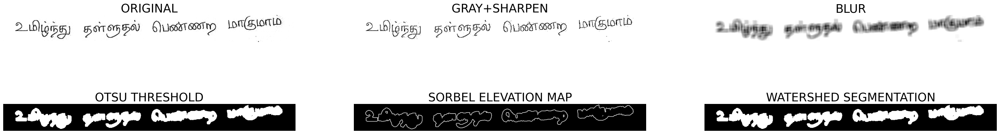

Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


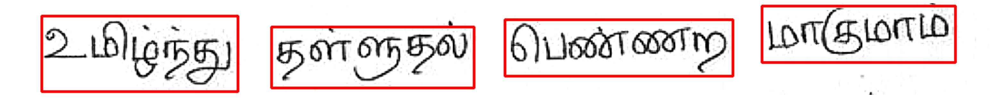

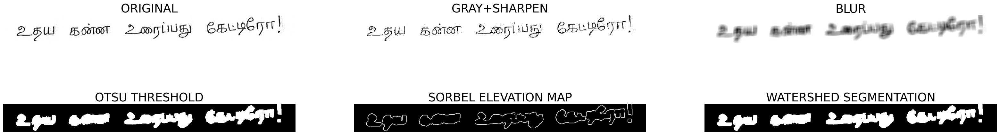

Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


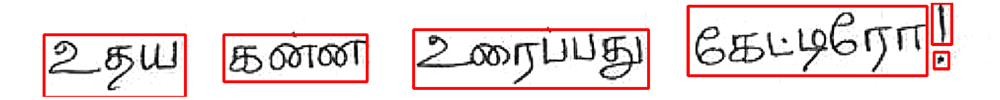

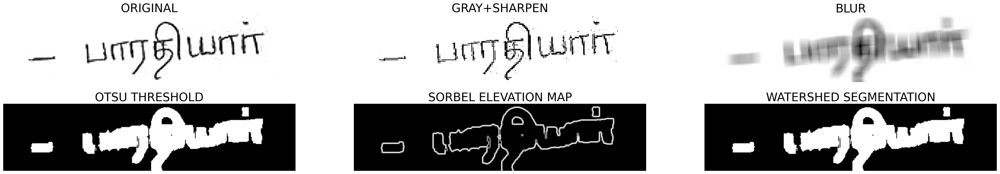

Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


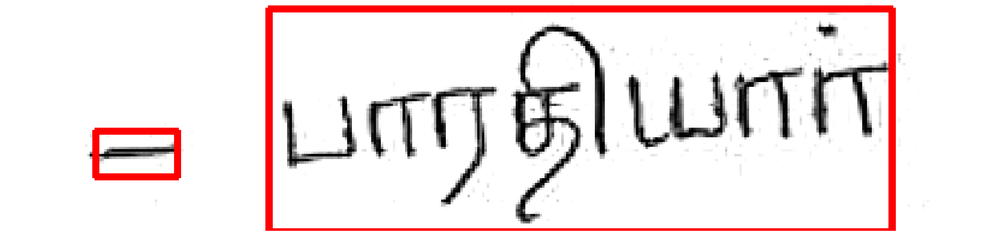

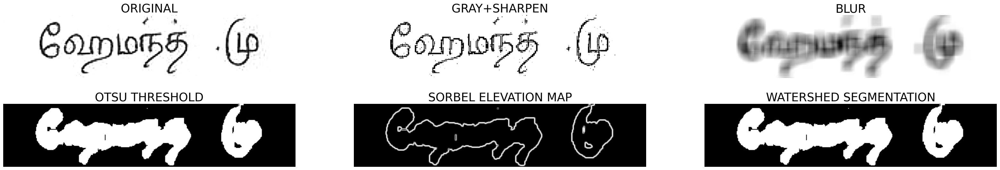

Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


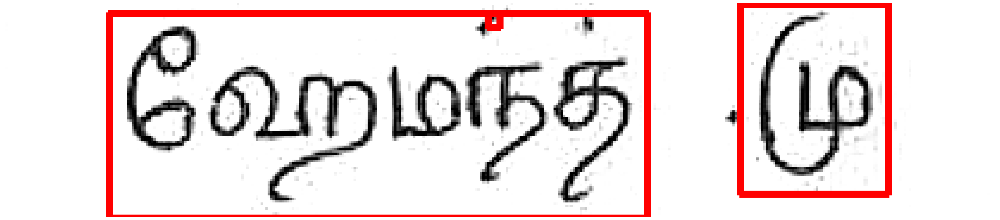

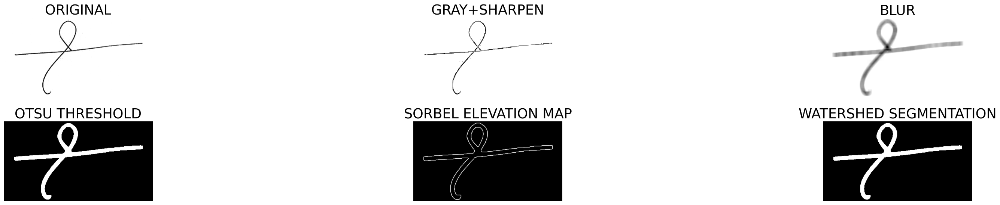

Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


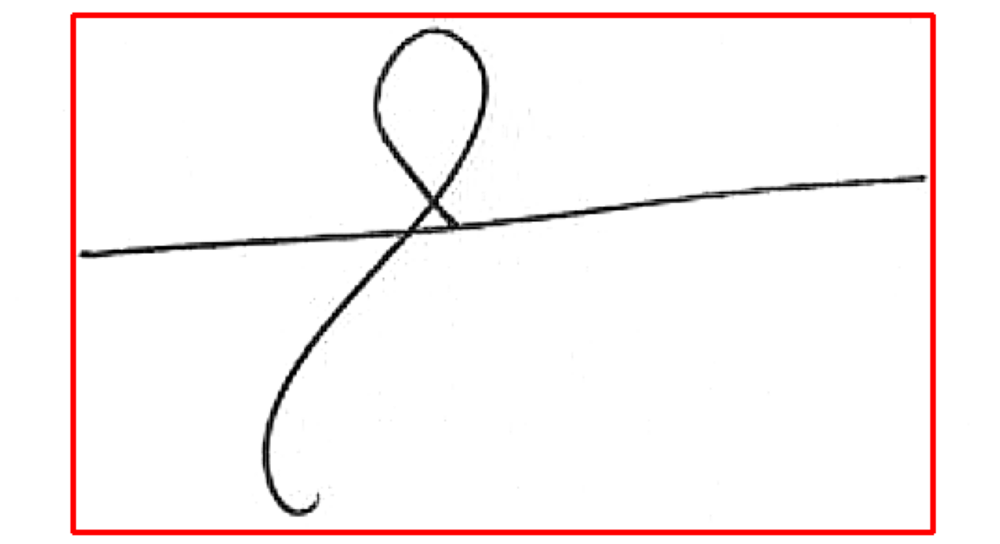

In [174]:
plt.rcParams['font.size']=22
def word_segments(_list):
    word_segmented_list=[]
    j=0
    for i in _list:
        preprocessed = preprocessing(i, kernel=15, plot=1, otsu=1, ht=10)
        th = dilate(preprocessed, plot=0, height=6, width=5)
        word_bounds= bounds(th, x=1, plot=0)
        words = segmented_list(i, word_bounds)
        word_segmented_list.append(words)
        
        plot_bounds(line_segmented_list[j],word_bounds)
        j+=1
    return word_segmented_list
    
word_segmented_list = word_segments(line_segmented_list)

In [175]:
word_segmented_list[7][0].shape

(66, 148, 3)

In [176]:
drop_zero_size_images(word_segmented_list[7])

Dropped Images: 1


[array([[[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [249, 249, 249],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [252, 252, 252],
         [254, 254, 254],
         [255, 255, 255]],
 
        ...,
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
  

In [180]:
for i in word_segmented_list[0]:
    drop_zero_size_images(i)
        
    try:
        plot_segments(i, x=10,y=5)
    except:
        pass

Dropped Images: 0
Dropped Images: 0
Dropped Images: 0
Dropped Images: 0
Dropped Images: 0


## Word --> Characters

Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


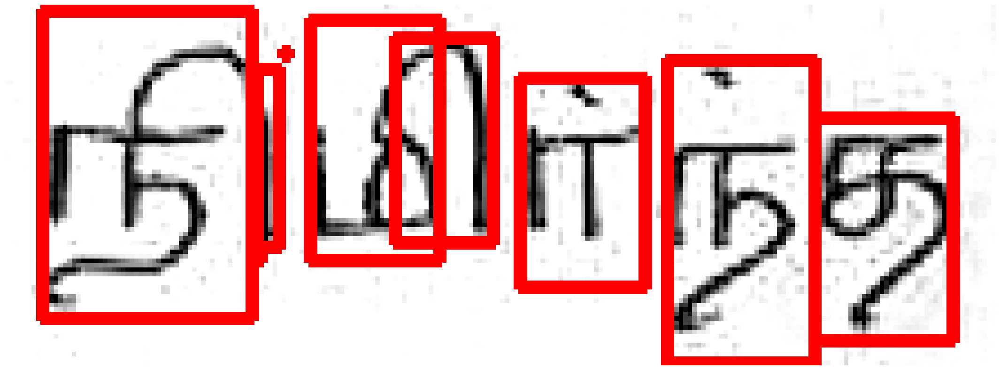

0
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


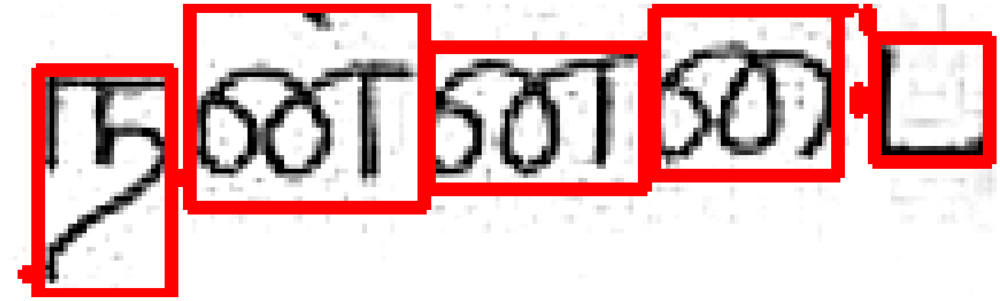

1
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


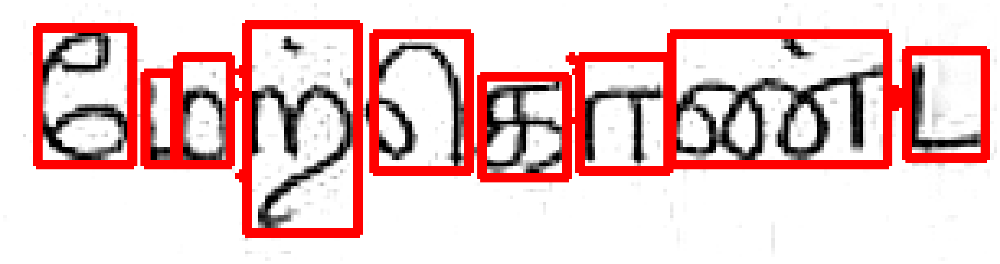

2
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


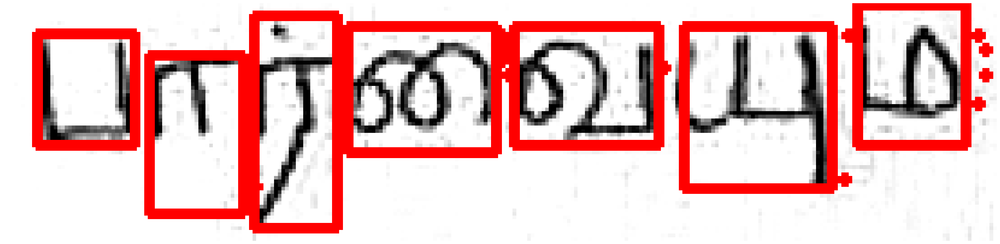

3
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


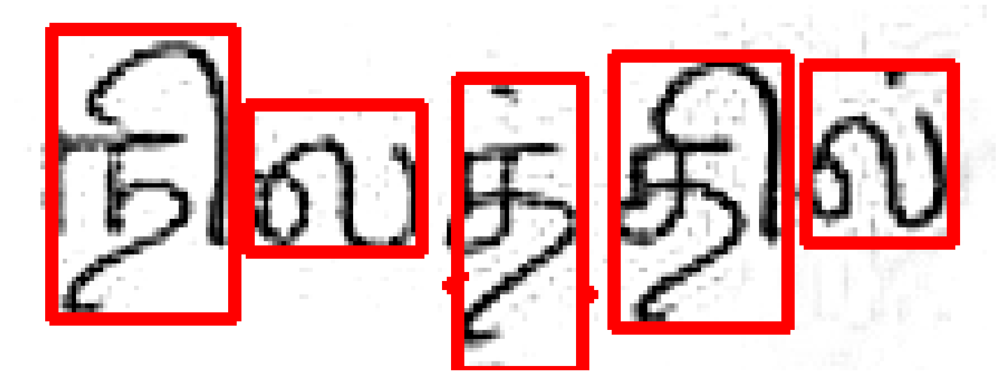

0
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


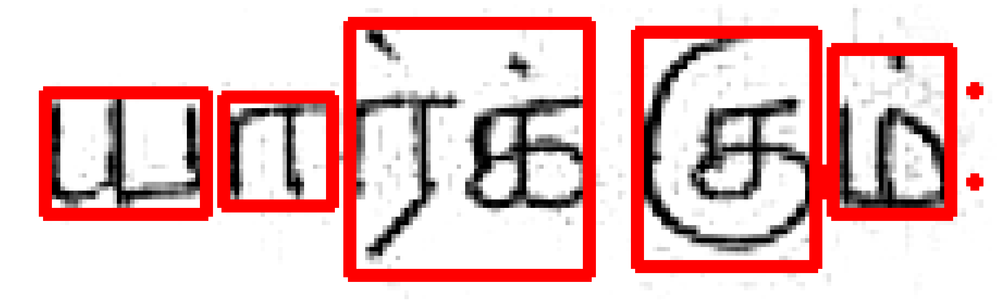

1
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


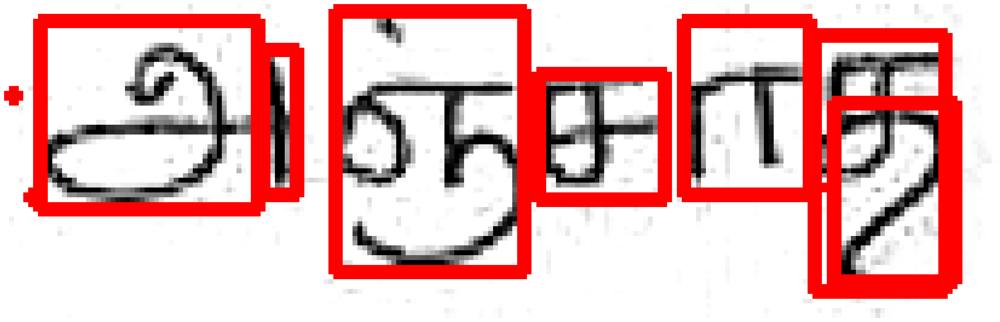

2
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


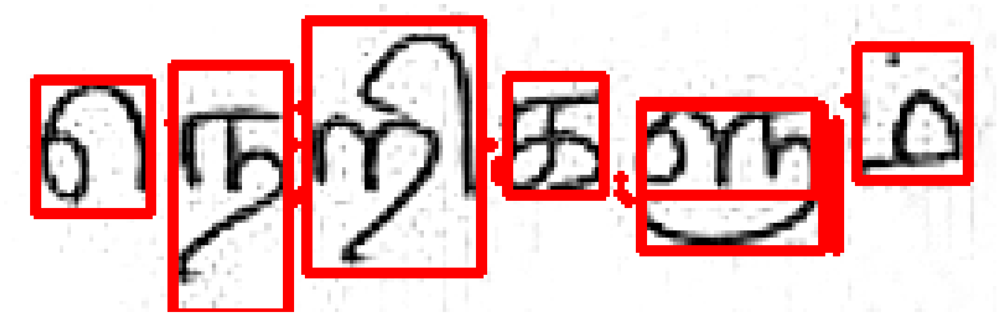

3
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


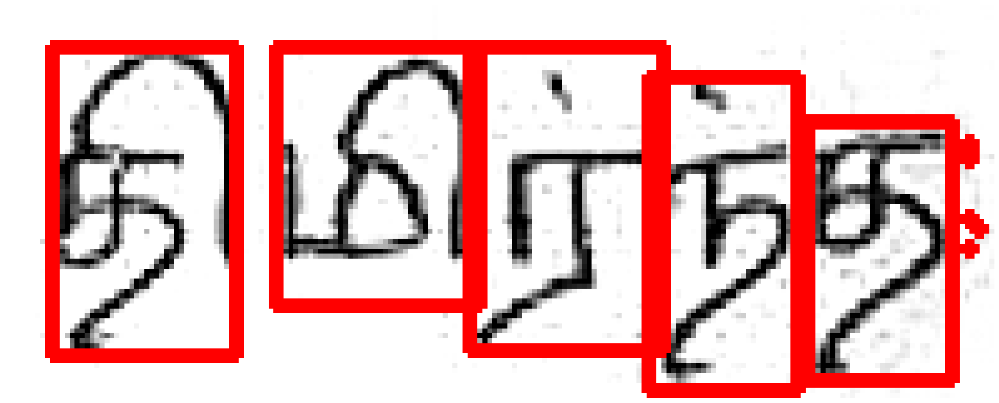

0
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


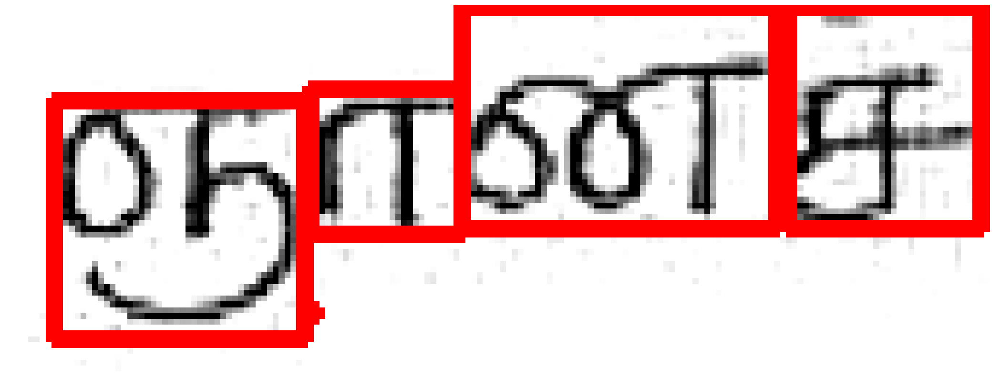

1
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


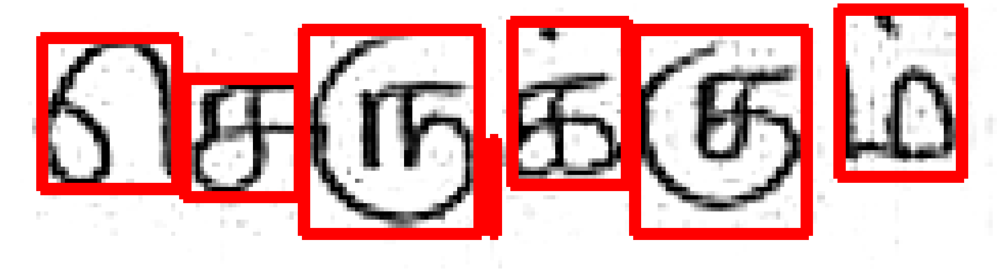

2
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


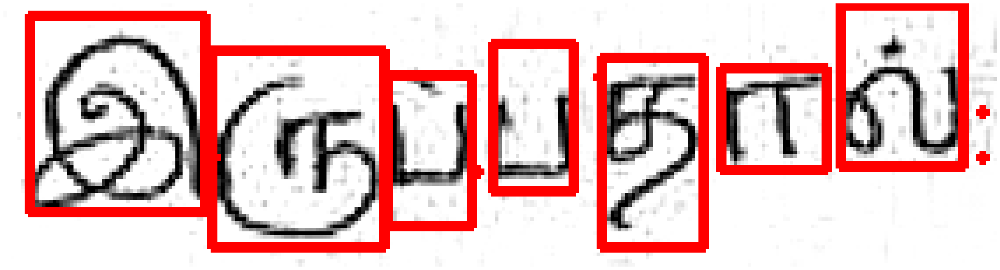

3
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


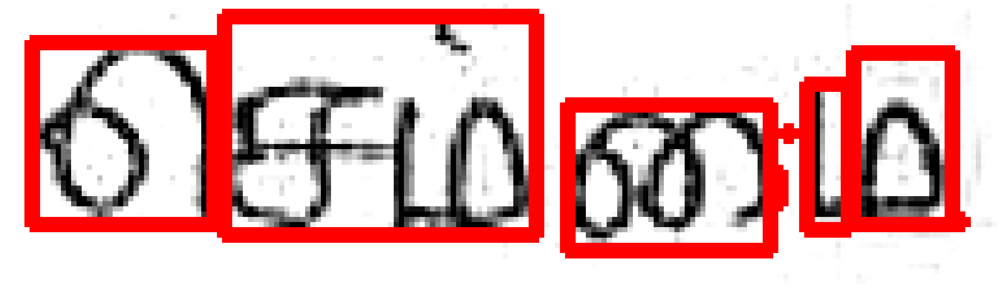

0
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


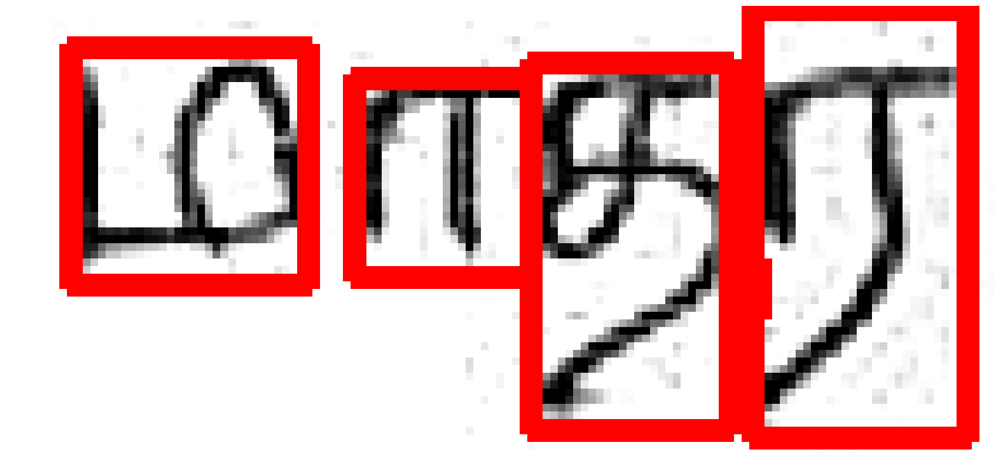

1
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


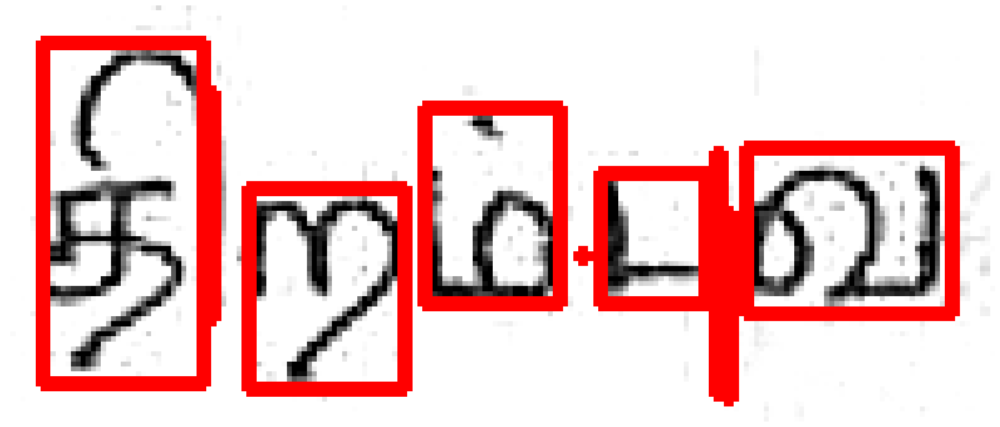

2
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


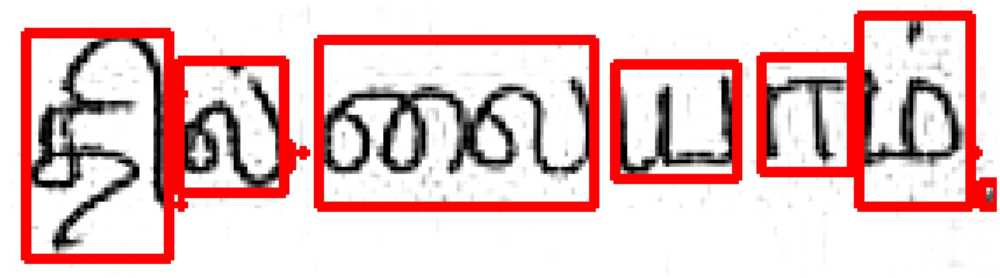

3
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


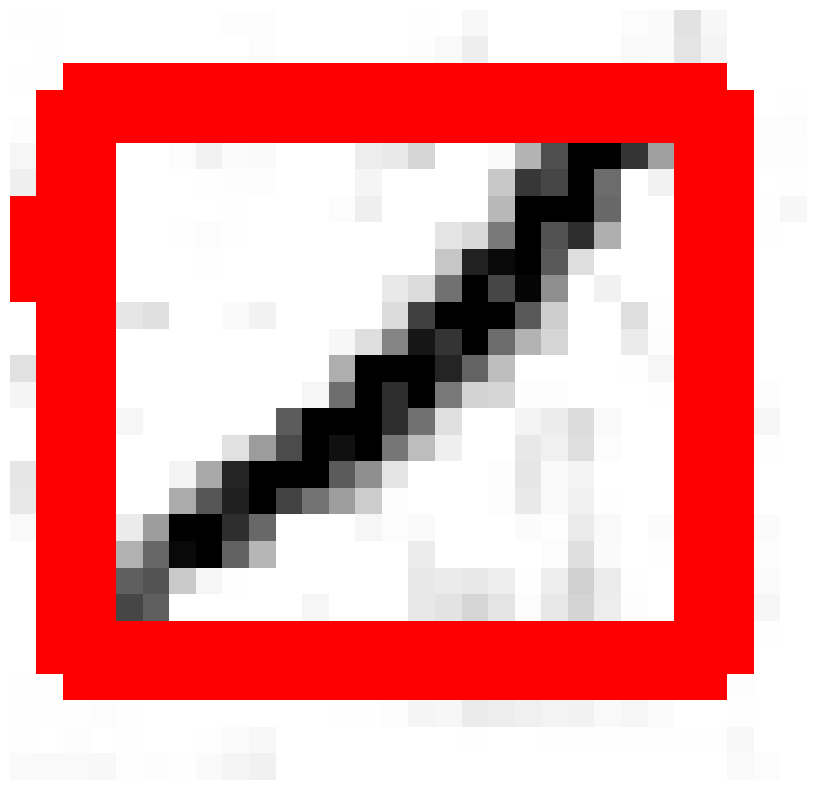

4
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


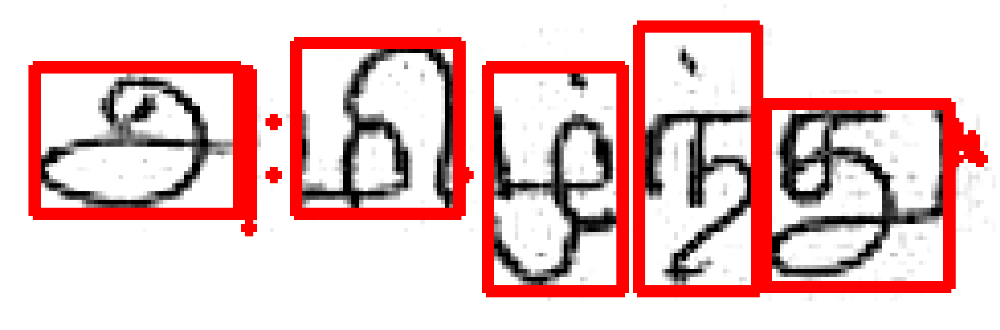

0
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


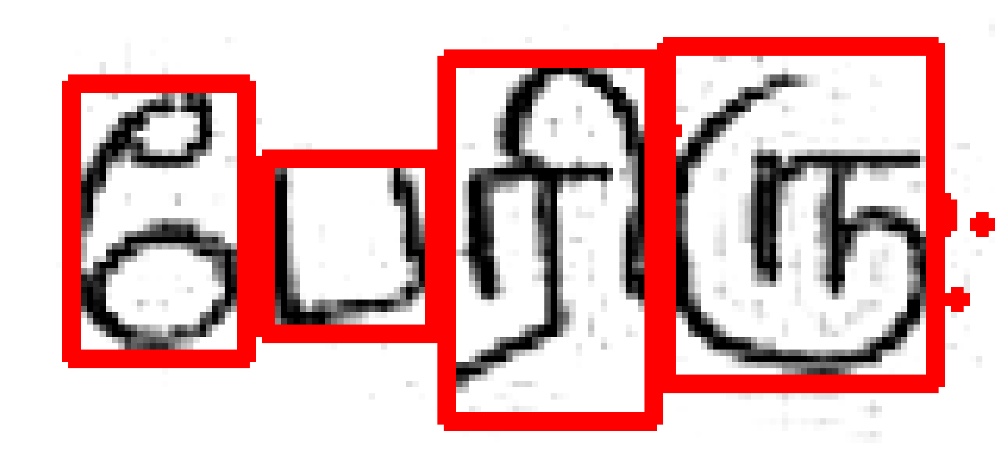

1
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


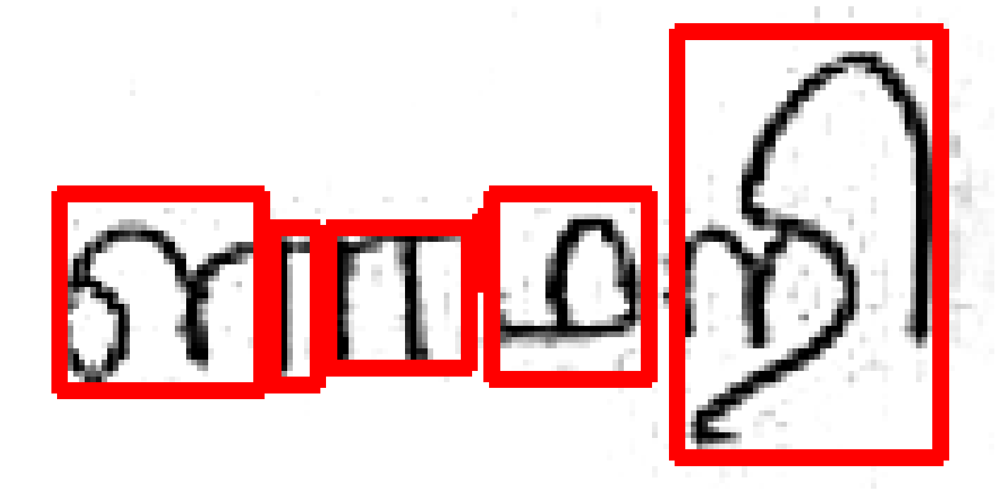

2
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


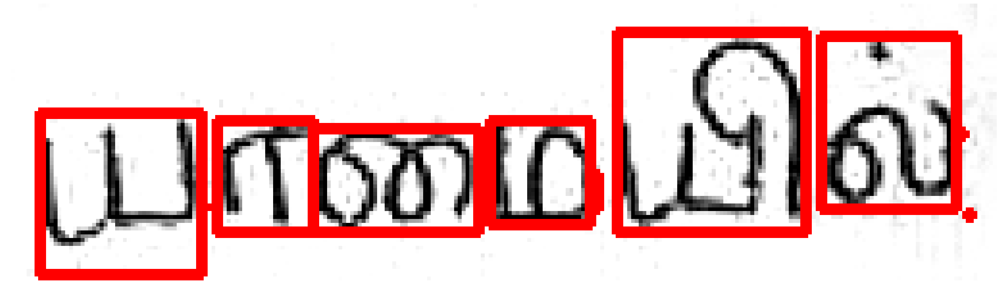

3
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


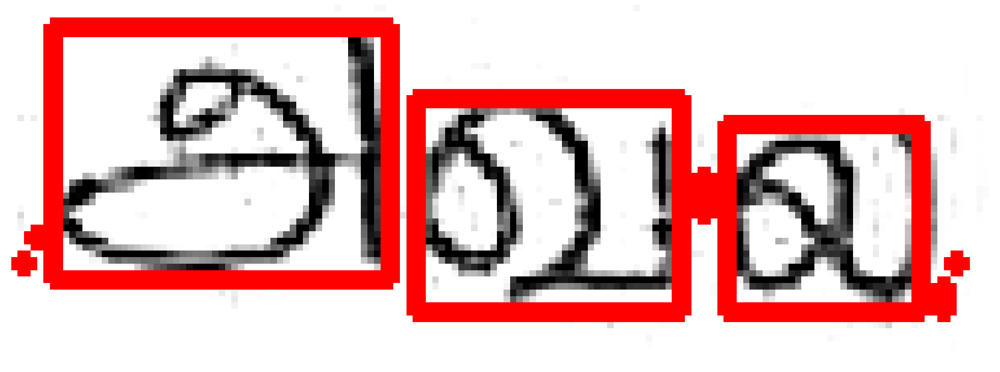

0
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


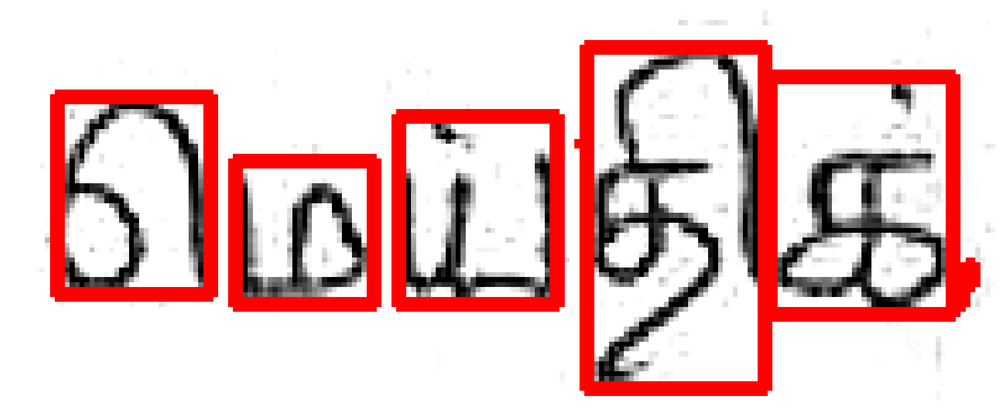

1
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


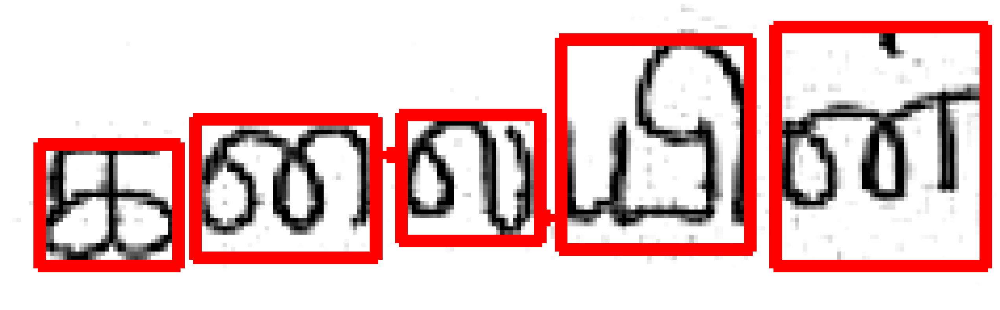

2
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


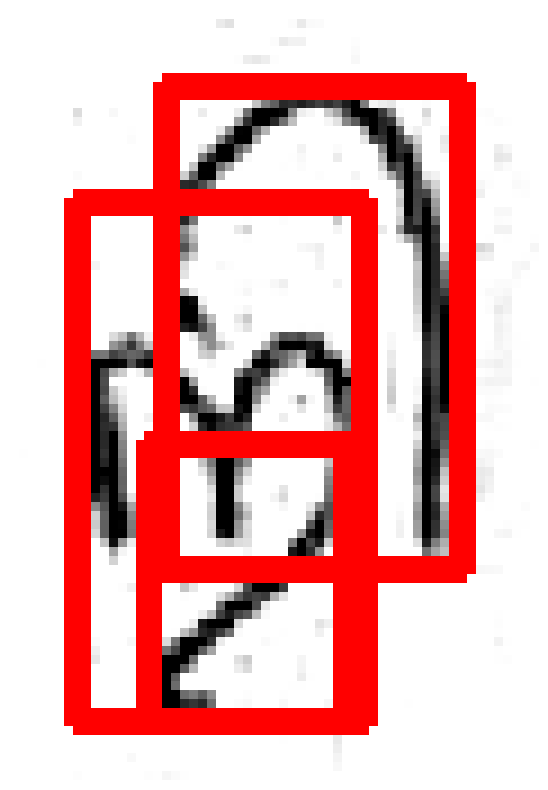

3
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


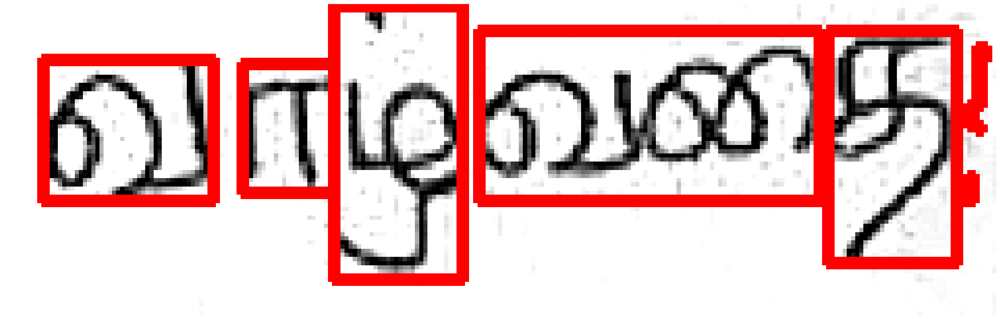

4
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


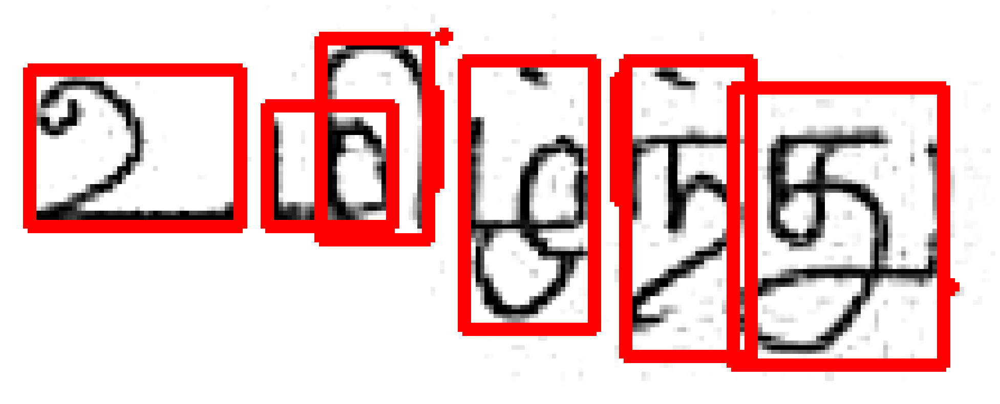

0
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


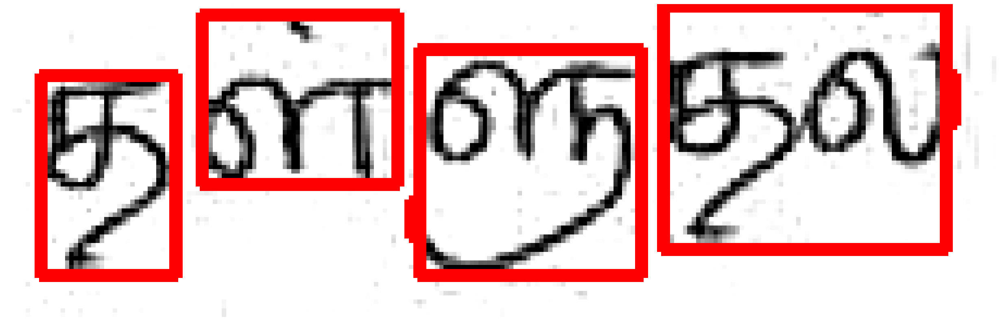

1
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


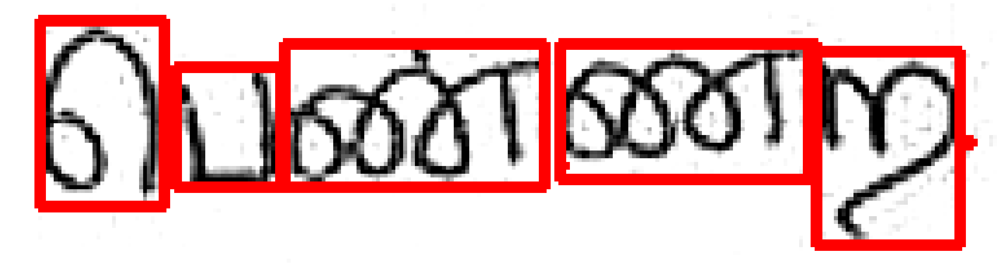

2
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


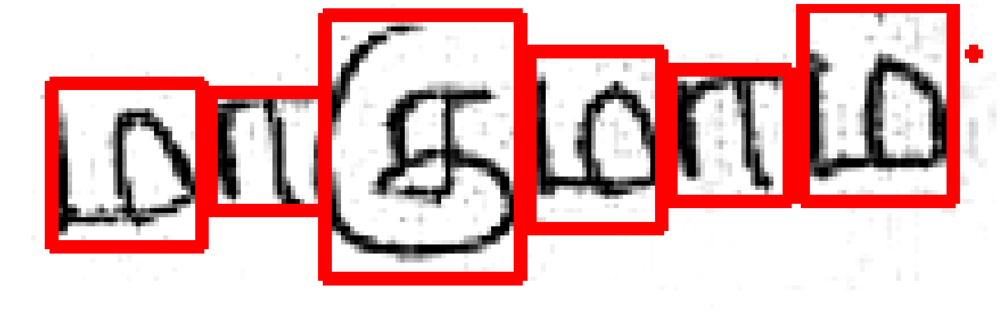

3
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


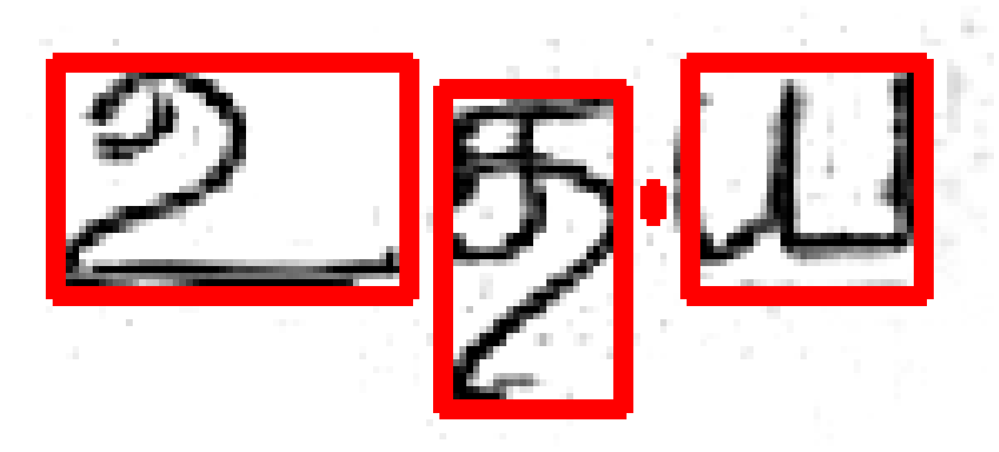

0
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


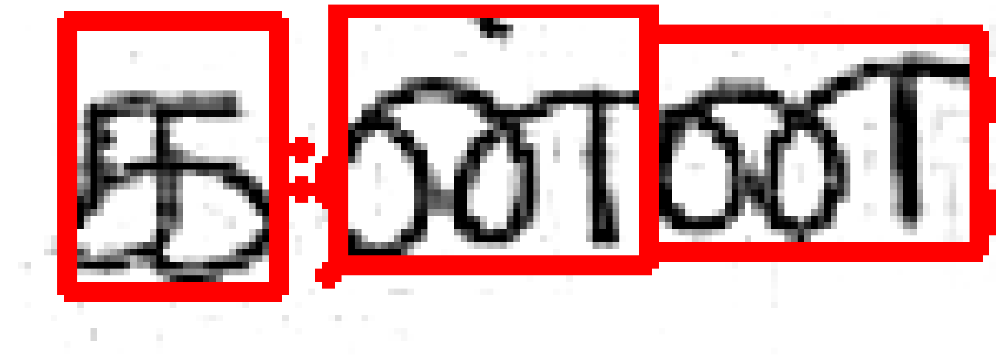

1
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


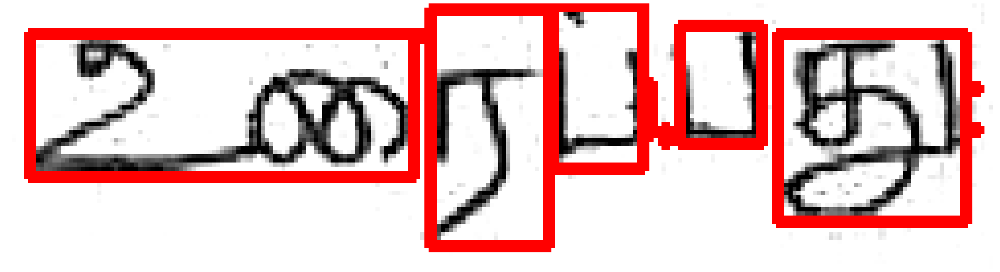

2
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


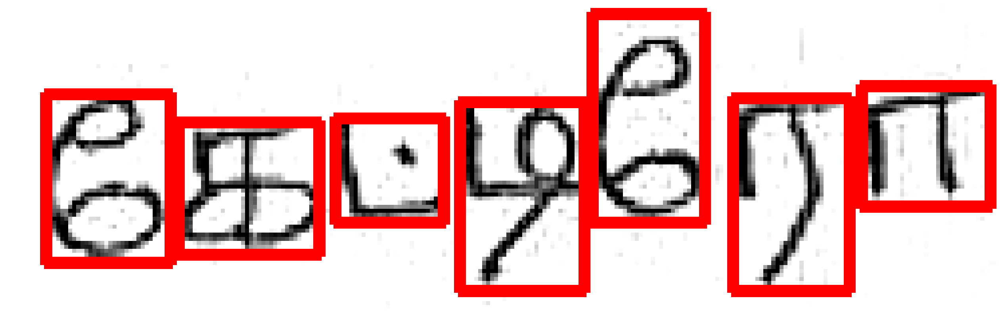

3
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


<Figure size 4000x1000 with 0 Axes>

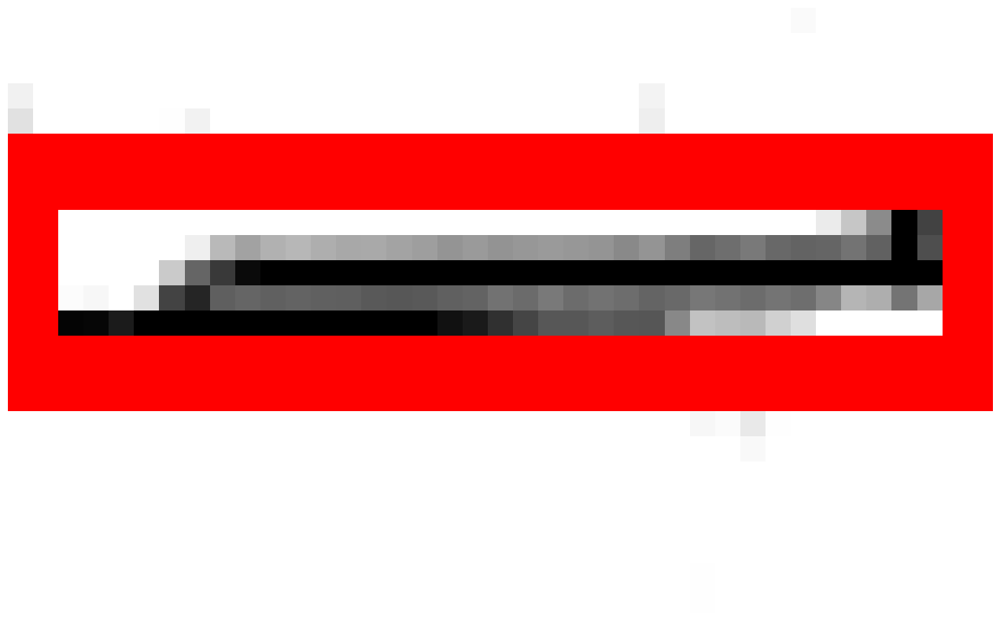

0
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


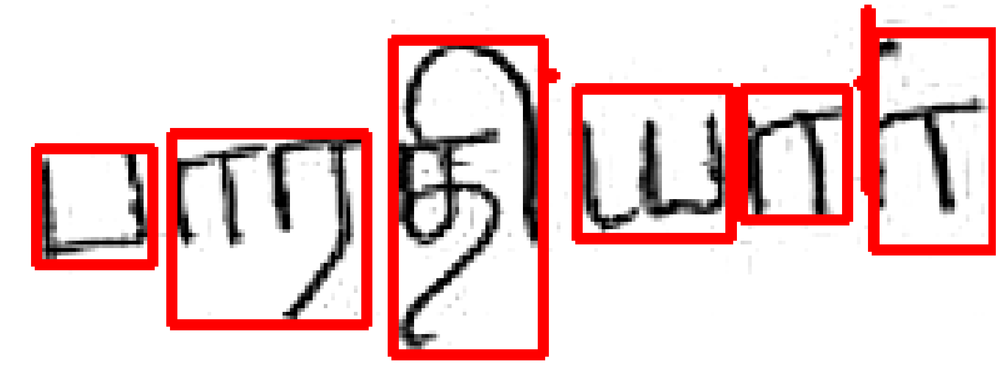

1
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


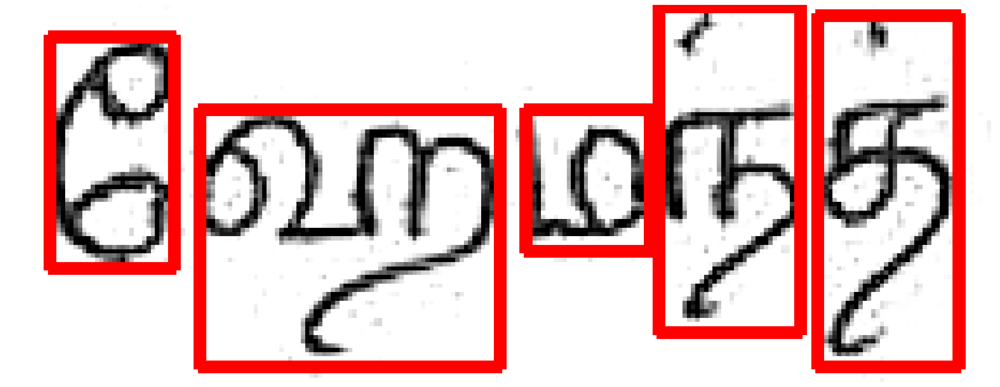

0
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


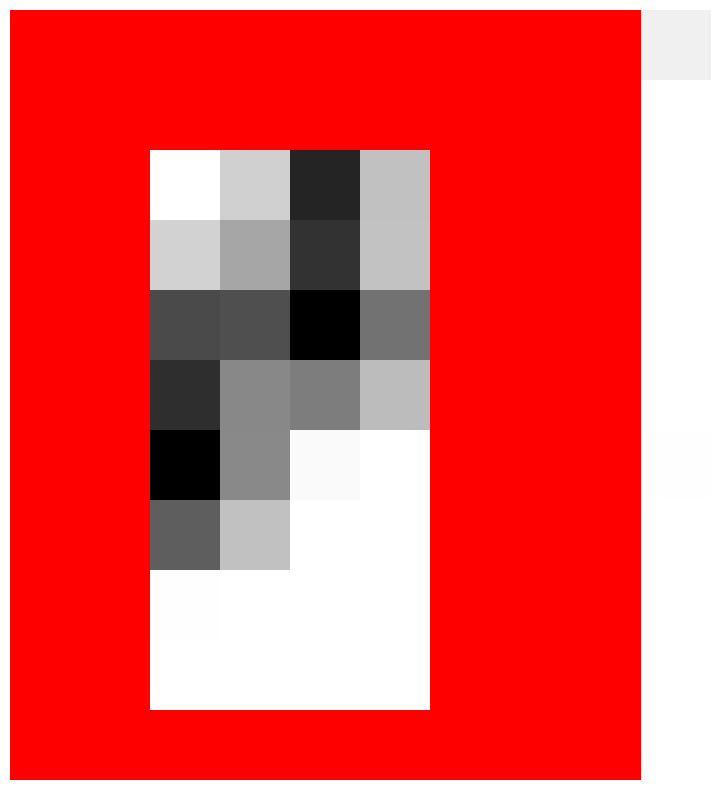

1
Returned segmented image.
Returned sentence_segmented imgage.
Returned list of bounding rectangles.
Returned list of segmented images.


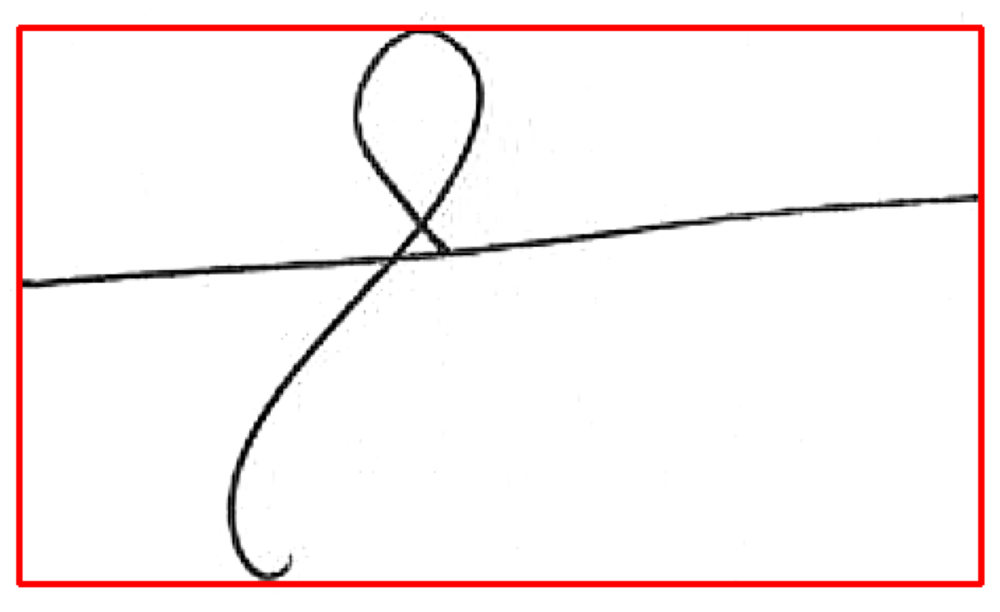

0


In [181]:
image = word_segmented_list[0][0]

def char_segments(_list):
    char_segmented_list=[]
    for j in range(len(_list)):
        k=0
        _word = []
        for i in _list[j]:
            try:
                preprocessed = preprocessing(i, kernel=1, plot_segmentation=0, otsu=1, plot=0)
                th = dilate(preprocessed, plot=0, height=3, width=1)
                char_bounds= bounds(th, epsilon=2, x=1, plot=0)
                updt_char_bounds = merge_boxes(char_bounds, 0.6)
                chars = segmented_list(i,updt_char_bounds)
                
                _word.append(chars)
                
                plot_bounds(word_segmented_list[j][k], updt_char_bounds)
                print(k)
                k+=1
            except:
                pass
        char_segmented_list.append(_word)
    return char_segmented_list
    
char_segmented_list = char_segments(word_segmented_list)

Dropped Images: 0


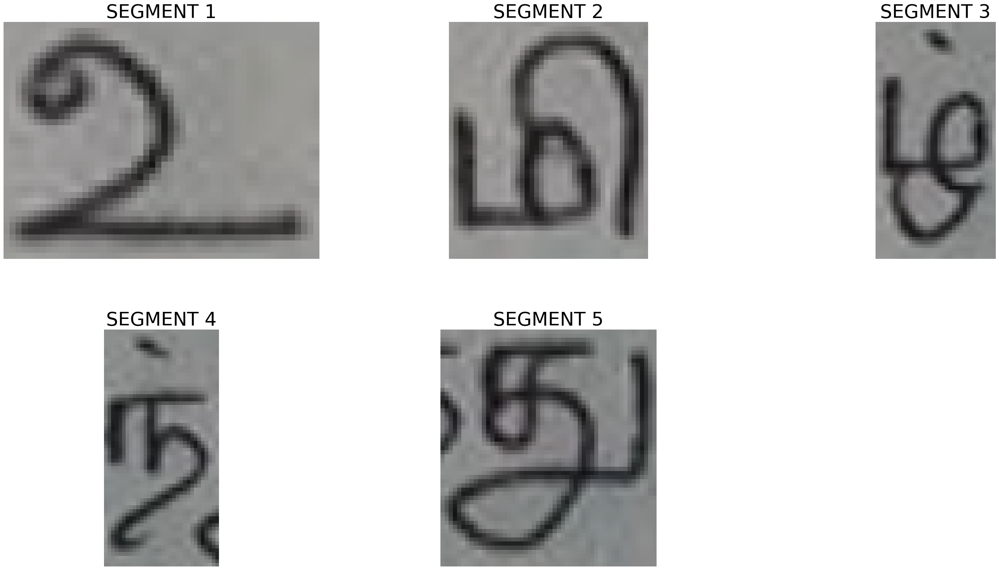

Dropped Images: 2
Dropped Images: 0


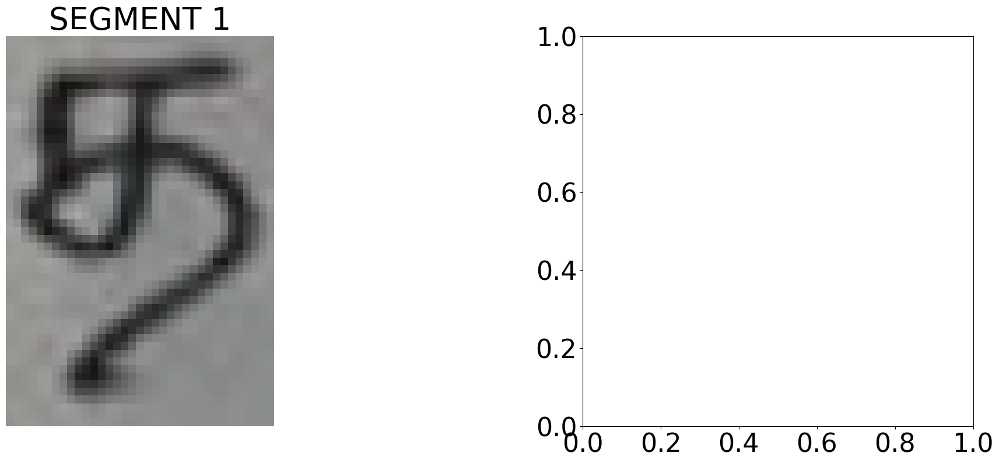

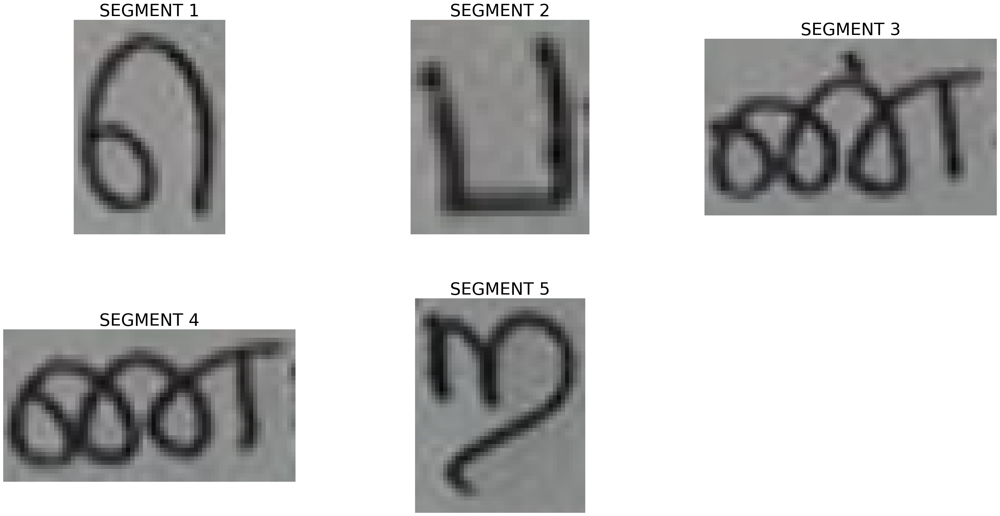

Dropped Images: 1


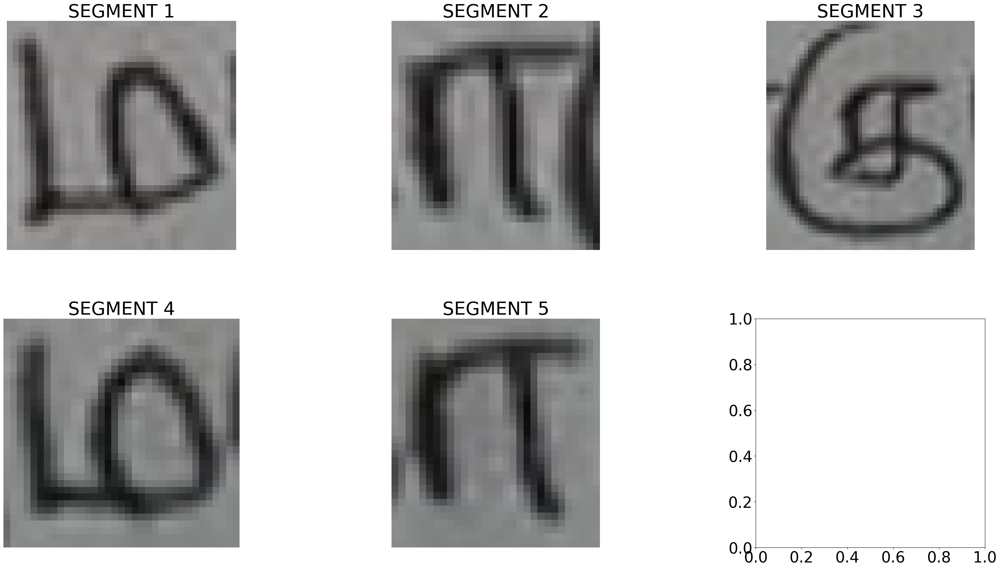

In [103]:
for i in char_segmented_list[-5]:
    drop_zero_size_images(i)
    plt.rcParams['font.size']=32
    plt.rcParams['figure.subplot.hspace']=.3
    try:
        plot_segments(i, x=10,y=5, wd=40, ht=20)
    except:
        pass

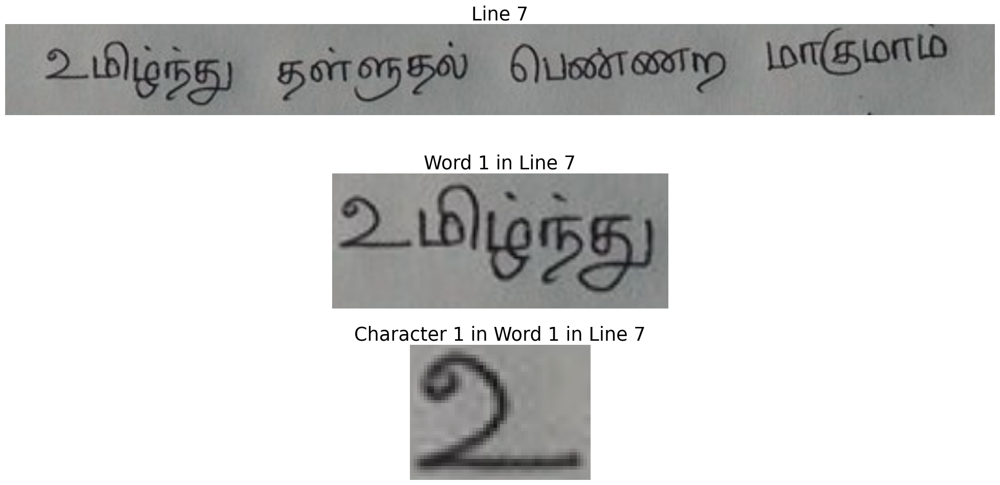

In [85]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))

plt.subplot(3, 1, 1)
plt.imshow(line_segmented_list[6])
plt.title('Line 7')
plt.axis('off')

plt.subplot(3, 1, 2)
plt.imshow(word_segmented_list[6][0])
plt.title('Word 1 in Line 7')
plt.axis('off')

plt.subplot(3, 1, 3)
plt.imshow(char_segmented_list[6][0][-5])
plt.title('Character 1 in Word 1 in Line 7')
plt.axis('off')

plt.tight_layout()
plt.show()

## Model 

In [28]:
import tensorflow as tf
from keras.models import load_model
from keras.preprocessing import image

In [29]:
model = load_model('../Tamil-NN/model2.h5')
model.summary()sdf

SyntaxError: invalid syntax (3236462547.py, line 2)

In [ ]:
def predict_image(image, model):

    tamil_dict={0: 'ா', 1: 'அ', 2: 'ஆ', 3: 'இ', 4: 'ஈ', 5: 'உ', 6: 'ஊ', 7: 'எ', 8: 'ஏ', 9: 'ஐ', 10: 'ஒ', 11: 'ஓ', 12: 'ஔ', 13: 'ஃ', 14: 'க்', 
    15: 'க', 16: 'கி', 17: 'கீ', 18: 'கு', 19: 'கூ', 20: 'ச்', 21: 'ச', 22: 'சி', 23: 'சீ', 24: 'சு', 25: 'சூ', 26: 'ங்', 27: 'ங', 28: 'ஙி', 29: 'ஙீ', 30: 'ஙு', 
    31: 'ஙூ', 32: 'ஞ்', 33: 'ஞ', 34: 'ஞி', 35: 'ஞீ', 36: 'ஞு', 37: 'ஞூ', 38: 'ட்', 39: 'ட', 40: 'ழ',41: 'டீ', 42: 'டு', 43: 'டூ', 44: 'ண்', 45: 'ண', 
    46: 'ணி', 47: 'ணீ', 48: 'ணு', 49: 'ணூ', 50: 'த்', 51: 'த', 52: 'தி', 53: 'தீ', 54: 'து', 55: 'தூ', 56: 'ந்', 57: 'ந', 58: 'நி', 59: 'நீ', 60: 'நு',
    61: 'நூ', 62: 'ப்', 63: 'ப', 64: 'பி', 65: 'பீ', 66: 'பு', 67: 'பூ', 68: 'ம்', 69: 'ம', 70: 'மி', 71: 'மீ', 72: 'மு', 73: 'மூ', 74: 'ய்', 75: 'ய', 
    76: 'யி', 77: 'யீ',78: 'யு', 79: 'யூ', 80: 'ர்', 81: 'ர', 82: 'ரி', 83: 'ரீ', 84: 'ரு', 85: 'ரூ', 86: 'ல்', 87: 'ல', 88: 'லி', 89: 'லீ', 90: 'லு', 
    91: 'லூ', 92: 'ன்', 93: 'ன', 94: 'னி', 95: 'னீ', 96: 'ளு', 97: 'ளூ', 98: 'ற்', 99: 'ற', 100: 'றி', 101: 'றீ', 102: 'று', 103: 'றூ', 104: 'வ்', 
    105: 'வ', 106: 'வி', 107: 'வீ', 108: 'வு', 109: 'வூ', 110: 'ழ்', 111: 'ழ', 112: 'ழி', 113: 'ழீ', 114: 'ழு', 115: 'ழூ', 116: 'ன்', 117: 'ன', 118: 'னி',
    119: 'னீ', 120: 'னு',121: 'ஷி', 122: 'ஷீ', 123: 'ஷு', 124: 'ஷூ', 125: 'க்ஷ', 126: 'க்ஷ்', 127: ' க்ஷி', 128: ' க்ஷீ', 129: 'ஜு', 130: 'ஜூ', 
    131: 'ஹ', 132: 'ஹ்', 133: 'ஹி', 134: 'ஹீ', 135: 'ஹு', 136: 'ஹூ', 137: 'ஸ', 138: 'ஸ்', 139: 'ஸி', 140: 'ஸீ', 141: 'ஸு', 142: 'ஸூ', 
    143: 'ஷ', 144: 'ஷ்', 145: 'னூ', 146: 'ஶ்ரீ', 147: 'க்ஷூ', 148: 'ஜ', 149: 'ஜ்', 150: 'ஜி', 151: 'ஜீ', 152: 'க்ஷீ', 153: 'ெ', 154: 'ே', 155: 'ை'}
    
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    ret, thresh = cv2.threshold(gray_image, 100, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    inv_thresh = cv2.bitwise_not(thresh)
    inverted=255-inv_thresh
    # plt.figure(figsize=(1,1))
    # plt.imshow(inverted, cmap='gray')
    # plt.show()
    
    masked_image_resized = cv2.resize(inverted, (64, 64))
    masked_image_resized = cv2.cvtColor(masked_image_resized, cv2.COLOR_GRAY2RGB)
    # plt.imshow(masked_image_resized)
    image_array = np.expand_dims(masked_image_resized, axis=0)
    prediction = model.predict(image_array)
    index = np.argmax(prediction)
    # print("Predicted class:", tamil_dict[index])

    return tamil_dict[index]

In [ ]:
print_line=[]
for line in range(len(line_segmented_list)):
    for word in range(len(word_segmented_list[line])):
        try:
            for char in char_segmented_list[line][word]:
                try:
                    pred_char = predict_image(char, model)
                    print_line.append(pred_char)
                except:
                    print_line.append('_')
        except:
            pass
        print_line.append('  ')
    print_line.append('\n')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

நிபிர்ந்த  ந_னைட  ேமற்ெகாண்ட  பார்ைவயுய  
நிலத்தில்  யார்க்குய்  அ_சாத  ெநறிகஞம்  
திபிர்ற்த  ஞான_  ெஃன்க்கு_  இருப்பதால்  
ெங்ைம  மாத_  திறம்பர்வ  தில்ஸயாம்ர்  
அபிழ்ந்து  ேபரிரு  னாமறி  யானயயில்  
அவல  ெமய்திக்  கனவபின்  ற்ெ  வாழ்ணதஃஃ  
உபிழ்ந்து  த_ந_  ெபணணற  மாகுமா_  
உதய  க_ன  ஊர_பது  ேகடழேரா  ழ    
ஃ  பஏதிபார்  
ேஹம_த்    
ஃ  


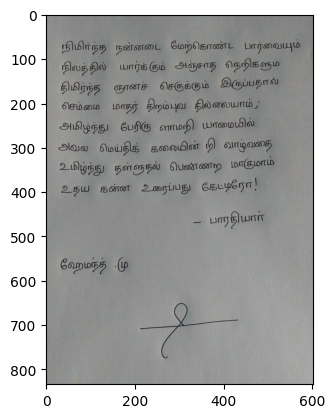

In [ ]:
for i in print_line:
    print(i, end='')

plt.imshow(doc)